### Итоговый проект по дисциплине "Машинное обучение и большие данные". 
Подготовили: Кабанов Илья и Калмацкий Арсен, группа 22П-3

# План работы
1. Подключение библиотек и импорт данных
2. Проведение предварительной обработки текстов размеченного датасета
3. Проведение тематического моделирования
4. Векторизация
5. Классификация
6. Парсинг данных с открытых источников
7. Экспорт модели для использования в API

## 1. Подключение библиотек и импорт данных

In [2]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [3]:
pip install pymorphy3

Note: you may need to restart the kernel to use updated packages.


In [4]:
import pandas as pd
import string
import re
import nltk
import pymorphy3

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

from sklearn.decomposition import TruncatedSVD

In [245]:
df = pd.read_csv('TextLanguage.csv')

In [247]:
df

,Text,Language
0,"Nature, in the broadest sense, is the natural...",English
1,"""Nature"" can refer to the phenomena of the phy...",English
2,"The study of nature is a large, if not the onl...",English
3,"Although humans are part of nature, human acti...",English
4,[1] The word nature is borrowed from the Old F...,English
...,...,...
10332,ನಿಮ್ಮ ತಪ್ಪು ಏನು ಬಂದಿದೆಯೆಂದರೆ ಆ ದಿನದಿಂದ ನಿಮಗೆ ಒ...,Kannada
10333,ನಾರ್ಸಿಸಾ ತಾನು ಮೊದಲಿಗೆ ಹೆಣಗಾಡುತ್ತಿದ್ದ ಮಾರ್ಗಗಳನ್...,Kannada
10334,ಹೇಗೆ ' ನಾರ್ಸಿಸಿಸಮ್ ಈಗ ಮರಿಯನ್ ಅವರಿಗೆ ಸಂಭವಿಸಿದ ಎ...,Kannada
10335,ಅವಳು ಈಗ ಹೆಚ್ಚು ಚಿನ್ನದ ಬ್ರೆಡ್ ಬಯಸುವುದಿಲ್ಲ ಎಂದು ...,Kannada


### Описание набора данных

In [250]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10337 entries, 0 to 10336
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Text      10337 non-null  object
 1   Language  10337 non-null  object
dtypes: object(2)
memory usage: 161.6+ KB


In [252]:
df['Language'].value_counts()

Language
English       1385
French        1014
Spanish        819
Portugeese     739
Italian        698
Russian        692
Sweedish       676
Malayalam      594
Dutch          546
Arabic         536
Turkish        474
German         470
Tamil          469
Danish         428
Kannada        369
Greek          365
Hindi           63
Name: count, dtype: int64

In [254]:
df = df.dropna()

## 2. Предварительная обработка данных

1. Перевод всех букв в тексте в нижний регистр
2. Удаление знаков препинания
3. Токенизация по словам
4. Удаление стоп слов
5. Стемминг (приведение слов к нормальной форме)
6. Лемматизация

In [258]:
def remove_punctuation(text): 
    return "".join([ch if ch not in string.punctuation else ' ' for ch in text])

def remove_numbers(text): 
    return ''.join([i if not i.isdigit() else ' ' for i in text])

def remove_multiple_spaces(text): 
    return re.sub(r'\s+', ' ', text, flags=re.I)

st = '❯\xa0—«»'
def remove_othersymbol(text):
    return ''.join([ch if ch not in st else ' ' for ch in text])

def remove_english(text):
    return text
#    return re.sub(r'[a-zA-Z]', '', text)

In [260]:
df['Обработанный текст'] = [remove_multiple_spaces(remove_numbers(remove_othersymbol(remove_punctuation(remove_english(text.lower()))))) for text in df['Text']]

In [261]:
df.head()

,Text,Language,Обработанный текст
0,"Nature, in the broadest sense, is the natural...",English,nature in the broadest sense is the natural p...
1,"""Nature"" can refer to the phenomena of the phy...",English,nature can refer to the phenomena of the phys...
2,"The study of nature is a large, if not the onl...",English,the study of nature is a large if not the only...
3,"Although humans are part of nature, human acti...",English,although humans are part of nature human activ...
4,[1] The word nature is borrowed from the Old F...,English,the word nature is borrowed from the old fren...


In [262]:
ru_stop = stopwords.words("russian")
en_stop = stopwords.words("english")
fr_stop = stopwords.words("french")
es_stop = stopwords.words("spanish")
pt_stop = stopwords.words("portuguese")
it_stop = stopwords.words("italian")
sv_stop = stopwords.words("swedish")
nl_stop = stopwords.words("dutch")
ar_stop = stopwords.words("arabic")
tr_stop = stopwords.words("turkish")
de_stop = stopwords.words("german")
da_stop = stopwords.words("danish")
el_stop = stopwords.words("greek")

all_stopwords = set(ru_stop + en_stop + fr_stop + es_stop + pt_stop + 
                   it_stop + sv_stop + nl_stop + ar_stop + tr_stop + 
                   de_stop + da_stop + el_stop)

def tokenize(text):
    t = word_tokenize(text)
    tokens = [token for token in t if token not in all_stopwords]
    text = " ".join(tokens)
    return text

In [263]:
df['Токенизированный текст'] = [tokenize(text) for text in df['Обработанный текст']]

In [264]:
df.head()

,Text,Language,Обработанный текст,Токенизированный текст
0,"Nature, in the broadest sense, is the natural...",English,nature in the broadest sense is the natural p...,nature broadest sense natural physical materia...
1,"""Nature"" can refer to the phenomena of the phy...",English,nature can refer to the phenomena of the phys...,nature refer phenomena physical world life gen...
2,"The study of nature is a large, if not the onl...",English,the study of nature is a large if not the only...,study nature large part science
3,"Although humans are part of nature, human acti...",English,although humans are part of nature human activ...,although humans part nature human activity oft...
4,[1] The word nature is borrowed from the Old F...,English,the word nature is borrowed from the old fren...,word nature borrowed old french nature derived...


In [333]:
import pandas as pd
import pymorphy3
from nltk.stem import SnowballStemmer, ISRIStemmer
from nltk.tokenize import word_tokenize
from functools import lru_cache
import re
from nltk import download

# Скачиваем необходимые данные NLTK
download('punkt')

# Инициализация инструментов для каждого языка
analyzers = {
    'russian': {'type': 'pymorphy', 'analyzer': pymorphy3.MorphAnalyzer(lang='ru')},
    'english': {'type': 'snowball', 'stemmer': SnowballStemmer('english')},
    'french': {'type': 'snowball', 'stemmer': SnowballStemmer('french')},
    'spanish': {'type': 'snowball', 'stemmer': SnowballStemmer('spanish')},
    'portuguese': {'type': 'snowball', 'stemmer': SnowballStemmer('portuguese')},
    'italian': {'type': 'snowball', 'stemmer': SnowballStemmer('italian')},
    'swedish': {'type': 'snowball', 'stemmer': SnowballStemmer('swedish')},
    'dutch': {'type': 'snowball', 'stemmer': SnowballStemmer('dutch')},
    'german': {'type': 'snowball', 'stemmer': SnowballStemmer('german')},
    'danish': {'type': 'snowball', 'stemmer': SnowballStemmer('danish')},
    'arabic': {'type': 'isri', 'stemmer': ISRIStemmer()},
    'turkish': {'type': 'lower'},  # Просто приведение к нижнему регистру
    'greek': {'type': 'lower'},    # Просто приведение к нижнему регистру
    'malayalam': {'type': 'lower'},
    'tamil': {'type': 'lower'},
    'kannada': {'type': 'lower'},
    'hindi': {'type': 'lower'}
}

@lru_cache(maxsize=100000)
def lemmatize_word(word: str, language: str) -> str:
    """Лемматизация одного слова с учетом языка"""
    if not word or not isinstance(word, str):
        return ""
    
    word = word.lower().strip()
    if not word:
        return ""
    
    try:
        lang_data = analyzers.get(language.lower(), {'type': 'lower'})
        
        if lang_data['type'] == 'pymorphy':
            return lang_data['analyzer'].parse(word)[0].normal_form
        elif lang_data['type'] == 'snowball':
            return lang_data['stemmer'].stem(word)
        elif lang_data['type'] == 'isri':
            return lang_data['stemmer'].stem(word)
        else:
            return word  # Для остальных языков просто возвращаем слово как есть
    
    except Exception:
        return word

def clean_text(text: str) -> str:
    """Очистка текста перед обработкой"""
    if not isinstance(text, str):
        return ""
    return re.sub(r'\s+', ' ', text).strip()

def lemmatize_text(text: str, language: str) -> str:
    """Лемматизация всего текста"""
    text = clean_text(text)
    if not text:
        return ""
    
    words = word_tokenize(text) if text else []
    lemmas = [lemmatize_word(word, language) for word in words if word]
    return " ".join(filter(None, lemmas))

# Применение к DataFrame
def apply_lemmatization(df: pd.DataFrame, text_col: str, lang_col: str) -> pd.DataFrame:
    """Применяет лемматизацию ко всему DataFrame"""
    df['Лемматизированный текст'] = df.apply(
        lambda row: lemmatize_text(row[text_col], row[lang_col].lower()), 
        axis=1
    )
    return df

df['Обработанный текст'] = df['Text'].apply(lambda text: remove_multiple_spaces(
    remove_numbers(remove_othersymbol(remove_punctuation(text.lower())))))
df['Токенизированный текст'] = df['Обработанный текст'].apply(tokenize)
df = apply_lemmatization(df, 'Токенизированный текст', 'Language')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [334]:
df

,Text,Language,Обработанный текст,Токенизированный текст,Лемматизированный текст
0,"Nature, in the broadest sense, is the natural...",English,nature in the broadest sense is the natural p...,nature broadest sense natural physical materia...,natur broadest sens natur physic materi world ...
1,"""Nature"" can refer to the phenomena of the phy...",English,nature can refer to the phenomena of the phys...,nature refer phenomena physical world life gen...,natur refer phenomena physic world life general
2,"The study of nature is a large, if not the onl...",English,the study of nature is a large if not the only...,study nature large part science,studi natur larg part scienc
3,"Although humans are part of nature, human acti...",English,although humans are part of nature human activ...,although humans part nature human activity oft...,although human part natur human activ often un...
4,[1] The word nature is borrowed from the Old F...,English,the word nature is borrowed from the old fren...,word nature borrowed old french nature derived...,word natur borrow old french natur deriv latin...
...,...,...,...,...,...
10332,ನಿಮ್ಮ ತಪ್ಪು ಏನು ಬಂದಿದೆಯೆಂದರೆ ಆ ದಿನದಿಂದ ನಿಮಗೆ ಒ...,Kannada,ನಿಮ್ಮ ತಪ್ಪು ಏನು ಬಂದಿದೆಯೆಂದರೆ ಆ ದಿನದಿಂದ ನಿಮಗೆ ಒ...,ನಿಮ್ಮ ತಪ್ಪು ಏನು ಬಂದಿದೆಯೆಂದರೆ ಆ ದಿನದಿಂದ ನಿಮಗೆ ಒ...,ನಿಮ್ಮ ತಪ್ಪು ಏನು ಬಂದಿದೆಯೆಂದರೆ ಆ ದಿನದಿಂದ ನಿಮಗೆ ಒ...
10333,ನಾರ್ಸಿಸಾ ತಾನು ಮೊದಲಿಗೆ ಹೆಣಗಾಡುತ್ತಿದ್ದ ಮಾರ್ಗಗಳನ್...,Kannada,ನಾರ್ಸಿಸಾ ತಾನು ಮೊದಲಿಗೆ ಹೆಣಗಾಡುತ್ತಿದ್ದ ಮಾರ್ಗಗಳನ್...,ನಾರ್ಸಿಸಾ ತಾನು ಮೊದಲಿಗೆ ಹೆಣಗಾಡುತ್ತಿದ್ದ ಮಾರ್ಗಗಳನ್...,ನಾರ್ಸಿಸಾ ತಾನು ಮೊದಲಿಗೆ ಹೆಣಗಾಡುತ್ತಿದ್ದ ಮಾರ್ಗಗಳನ್...
10334,ಹೇಗೆ ' ನಾರ್ಸಿಸಿಸಮ್ ಈಗ ಮರಿಯನ್ ಅವರಿಗೆ ಸಂಭವಿಸಿದ ಎ...,Kannada,ಹೇಗೆ ನಾರ್ಸಿಸಿಸಮ್ ಈಗ ಮರಿಯನ್ ಅವರಿಗೆ ಸಂಭವಿಸಿದ ಎಲ್...,ಹೇಗೆ ನಾರ್ಸಿಸಿಸಮ್ ಈಗ ಮರಿಯನ್ ಅವರಿಗೆ ಸಂಭವಿಸಿದ ಎಲ್...,ಹೇಗೆ ನಾರ್ಸಿಸಿಸಮ್ ಈಗ ಮರಿಯನ್ ಅವರಿಗೆ ಸಂಭವಿಸಿದ ಎಲ್...
10335,ಅವಳು ಈಗ ಹೆಚ್ಚು ಚಿನ್ನದ ಬ್ರೆಡ್ ಬಯಸುವುದಿಲ್ಲ ಎಂದು ...,Kannada,ಅವಳು ಈಗ ಹೆಚ್ಚು ಚಿನ್ನದ ಬ್ರೆಡ್ ಬಯಸುವುದಿಲ್ಲ ಎಂದು ...,ಅವಳು ಈಗ ಹೆಚ್ಚು ಚಿನ್ನದ ಬ್ರೆಡ್ ಬಯಸುವುದಿಲ್ಲ ಎಂದು ...,ಅವಳು ಈಗ ಹೆಚ್ಚು ಚಿನ್ನದ ಬ್ರೆಡ್ ಬಯಸುವುದಿಲ್ಲ ಎಂದು ...


In [267]:
df[df["Language"] == 'Russian']

,Text,Language,Обработанный текст,Токенизированный текст,Лемматизированный текст
5994,Nature (в переводе с англ.,Russian,nature в переводе с англ,nature переводе англ,nature перевод англ
5995,— «Природа») — один из самых старых и авторите...,Russian,природа один из самых старых и авторитетных о...,природа самых старых авторитетных общенаучных ...,природа самый старый авторитетный общенаучный ...
5996,"Публикует исследования, посвящённые широкому к...",Russian,публикует исследования посвящённые широкому кр...,публикует исследования посвящённые широкому кр...,публиковать исследование посвятить широкий кру...
5997,Первый номер журнала Nature был издан 4 ноября...,Russian,первый номер журнала nature был издан ноября г...,первый номер журнала nature издан ноября года ...,первый номер журнал nature издать ноябрь год а...
5998,Nature редактируется в Великобритании издатель...,Russian,nature редактируется в великобритании издатель...,nature редактируется великобритании издательст...,nature редактироваться великобритания издатель...
...,...,...,...,...,...
6681,Однажды Мелли и Терри снова пришли встретиться...,Russian,однажды мелли и терри снова пришли встретиться...,однажды мелли терри снова пришли встретиться м...,однажды мелли терри снова прислать встретиться...
6682,"О, привет, вы двое, так скажите нам Мэриан.",Russian,о привет вы двое так скажите нам мэриан,привет двое скажите нам мэриан,привет двое сказать мы мэриана
6683,Как' теперь нарциссизм Мэриан рассказал им обо...,Russian,как теперь нарциссизм мэриан рассказал им обои...,нарциссизм мэриан рассказал обоим произошло си...,нарциссизм мэриана рассказать оба произойти си...
6684,"Думаю, она не хотела бы больше золотого хлеба,...",Russian,думаю она не хотела бы больше золотого хлеба а...,думаю хотела золотого хлеба знаешь,думать хотеть золотой хлеб знать


## Облако слов

In [272]:
pip install WordCloud

Note: you may need to restart the kernel to use updated packages.


In [273]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline

In [274]:
# Получение текстовой строки из списка слов
def str_corpus(corpus):
    str_corpus = ''
    for i in corpus:
        str_corpus += ' ' + i
    str_corpus = str_corpus.strip()
    return str_corpus

# Получение списка всех слов в корпусе
def get_corpus(data):
    corpus = []
    for phrase in data:
        for word in phrase.split():
            corpus.append(word)
    return corpus

# Получение облака слов
def get_wordCloud(corpus):
    wordCloud = WordCloud(background_color='white',
                              stopwords=STOPWORDS,
                              width=3000,
                              height=2500,
                              max_words=200,
                              random_state=42
                         ).generate(str_corpus(corpus))
    return wordCloud

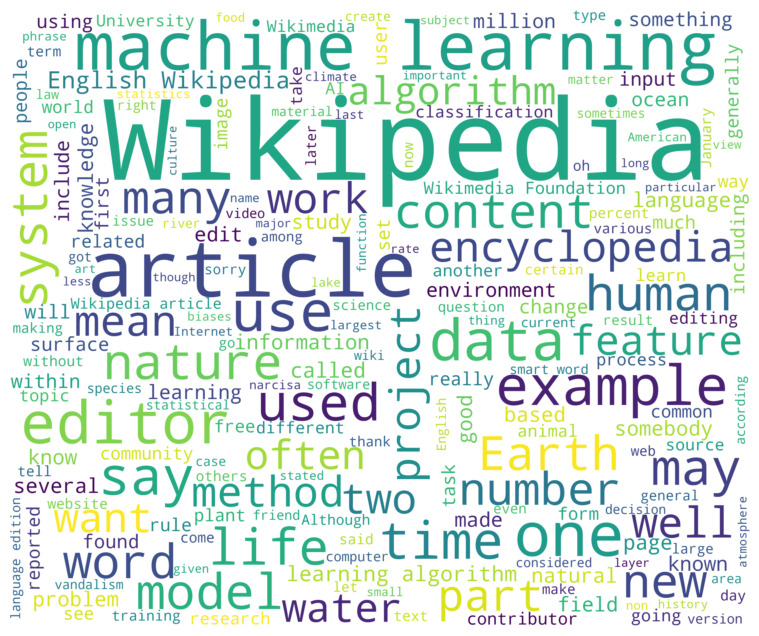

In [275]:
corpus = get_corpus(df[df["Language"] == "English"]['Text'].values)  # Правильная фильтрация

# Генерация облака слов
procWordCloud = get_wordCloud(corpus)

# Визуализация
fig = plt.figure(figsize=(20, 8))
plt.imshow(procWordCloud, interpolation='bilinear')  # Добавлен параметр interpolation
plt.axis('off')
plt.show()

In [276]:
import os

# Конфигурация
FONT_DIR = "noto_fonts"
os.makedirs(FONT_DIR, exist_ok=True)

# Пути к локальным файлам шрифтов
FONT_PATHS = {
    "Malayalam": os.path.join(FONT_DIR, "NotoSansMalayalam-Regular.ttf"),
    "Arabic": os.path.join(FONT_DIR, "NotoSansArabic-Regular.ttf"),
    "Hindi": os.path.join(FONT_DIR, "NotoSansDevanagari-Regular.ttf"),
    "Tamil": os.path.join(FONT_DIR, "NotoSansTamil-Regular.ttf"),
    "Greek": os.path.join(FONT_DIR, "NotoSansGreek-Regular.ttf"),
    "Kannada": os.path.join(FONT_DIR, "NotoSansKannada-Regular.ttf"),
    "Russian": os.path.join(FONT_DIR, "NotoSans-Regular.ttf"),
    "Turkish": os.path.join(FONT_DIR, "NotoSans-Regular.ttf")
}

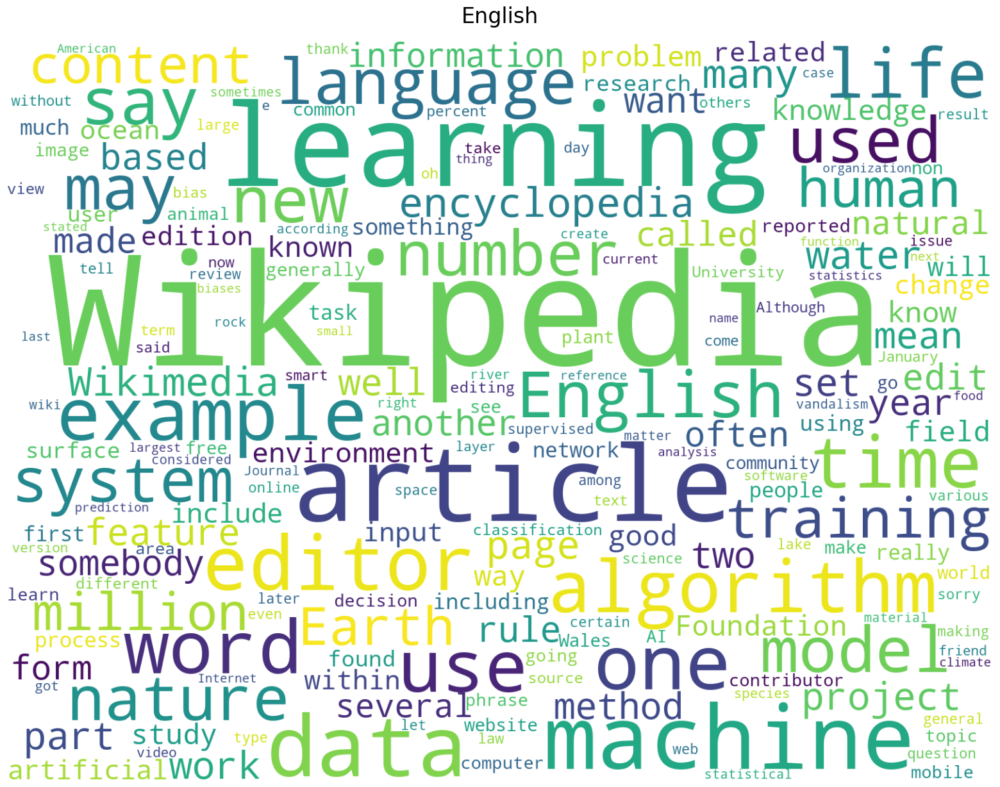

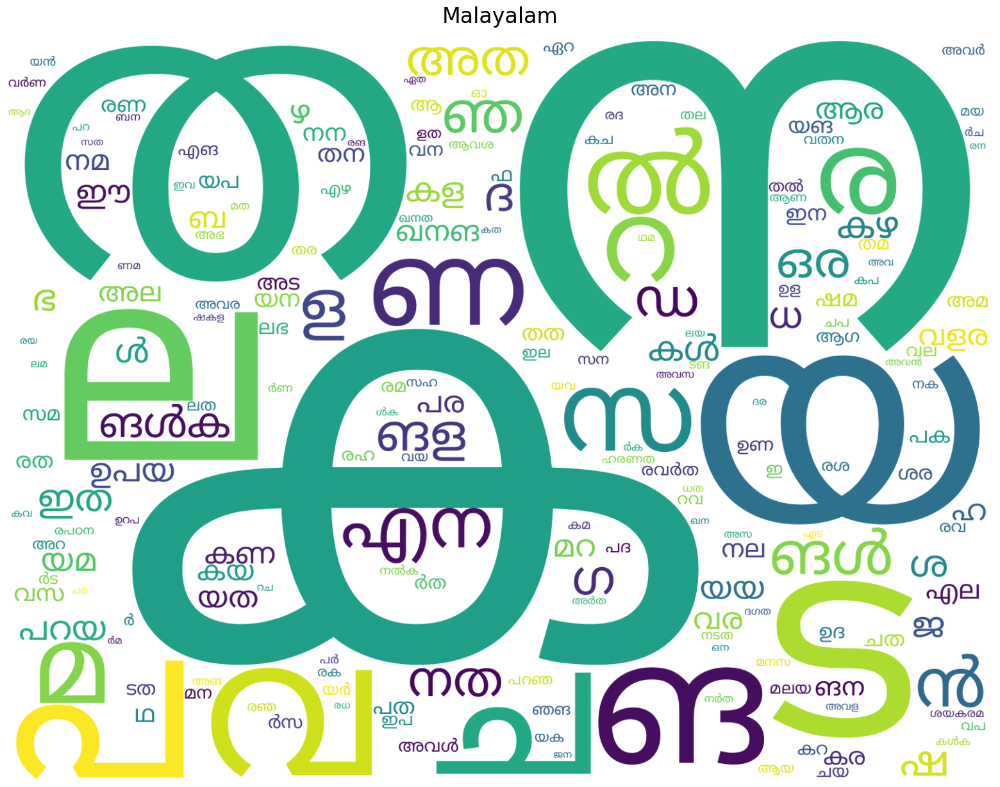

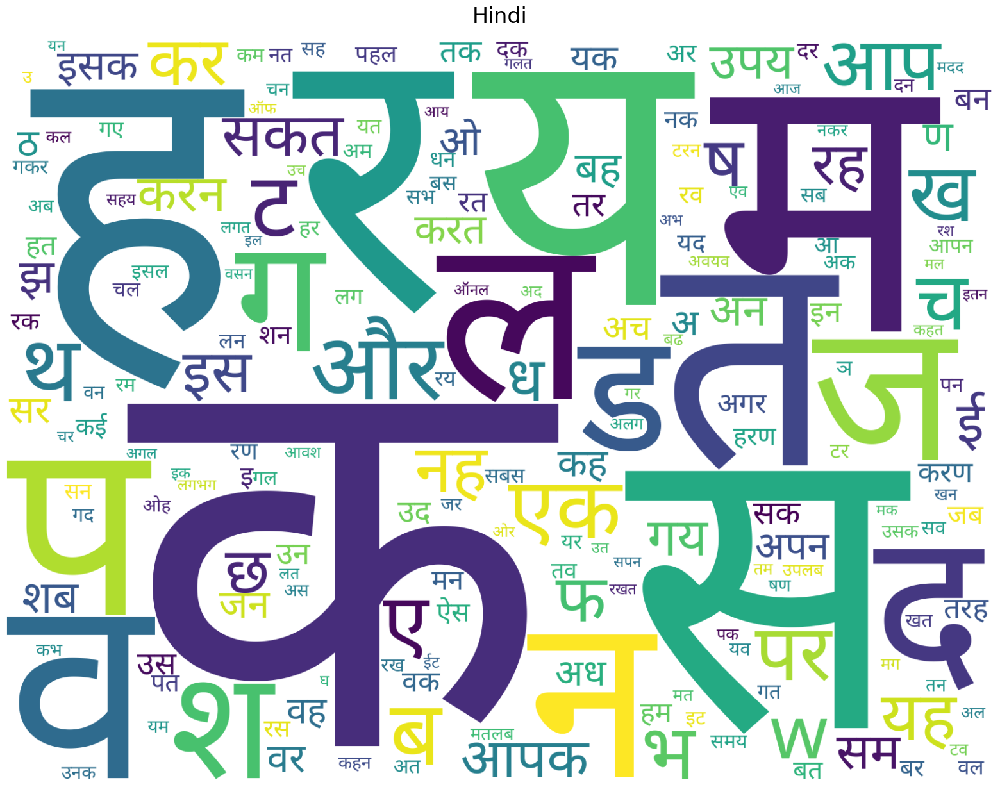

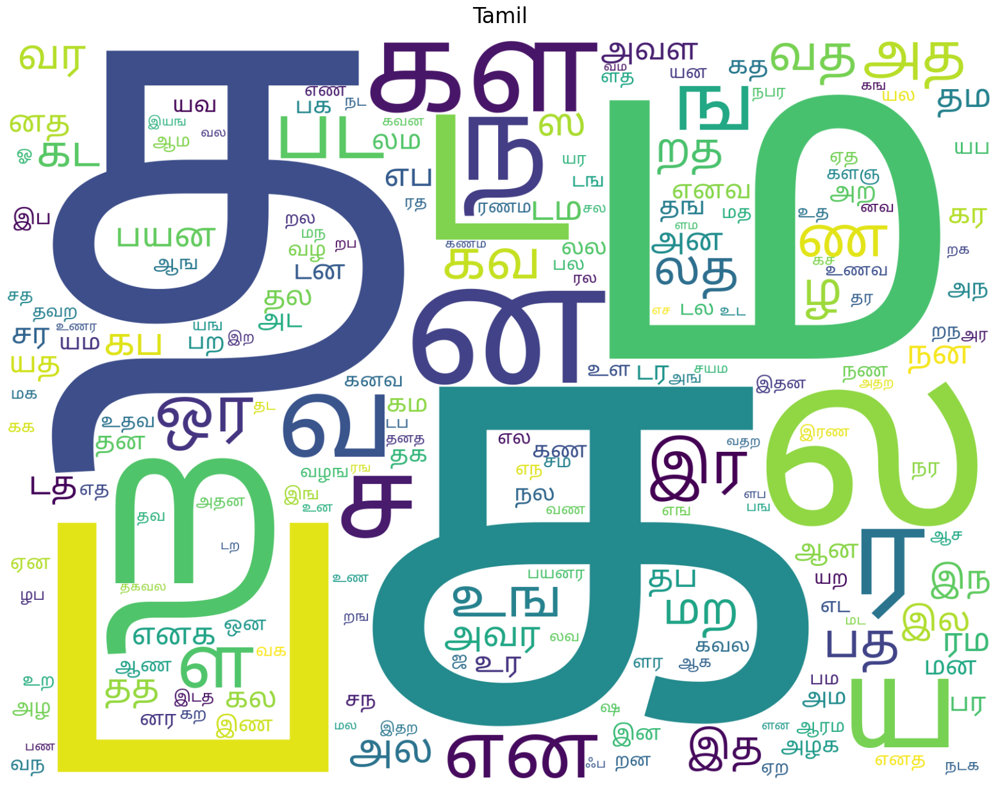

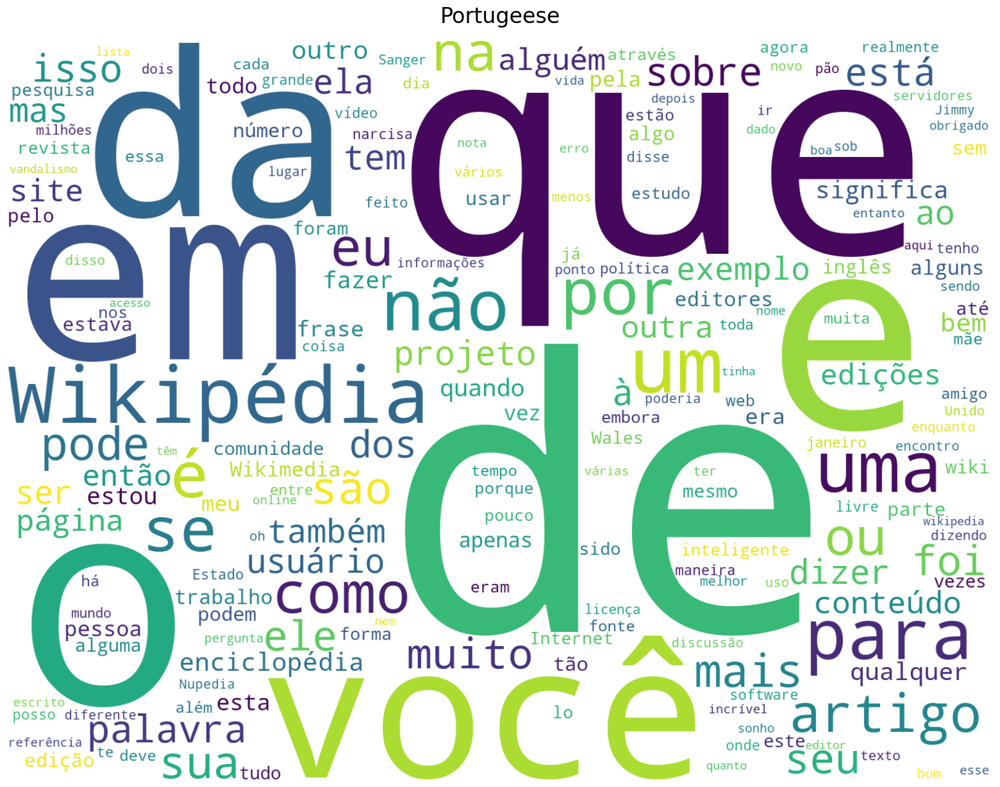

...

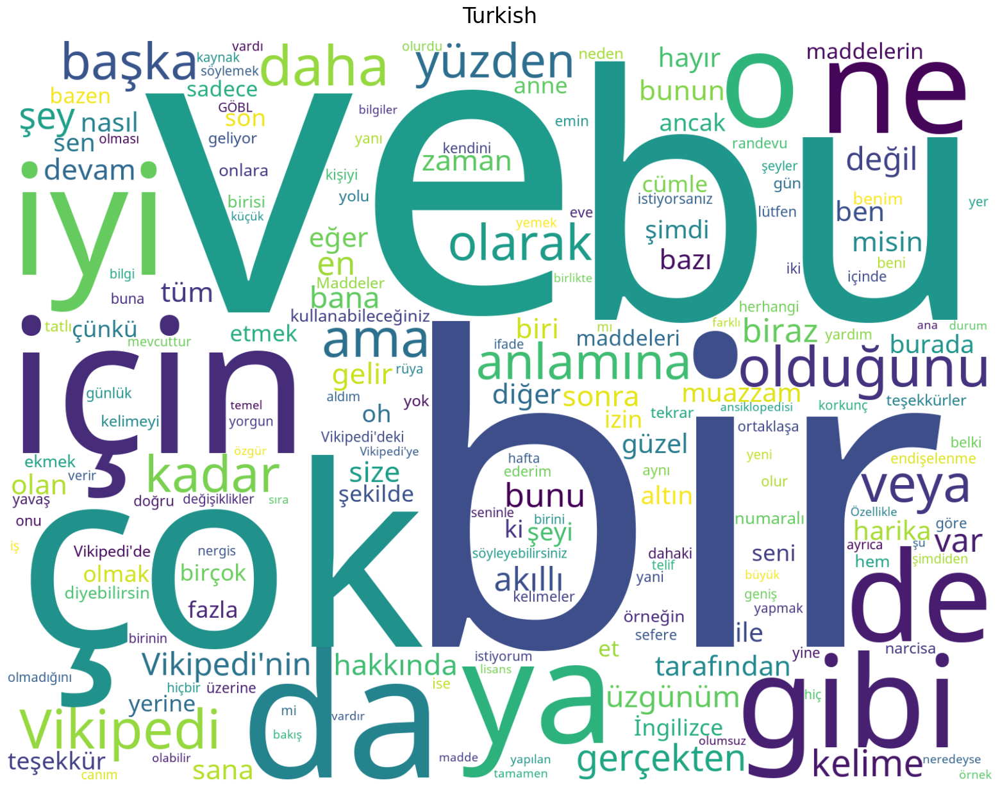

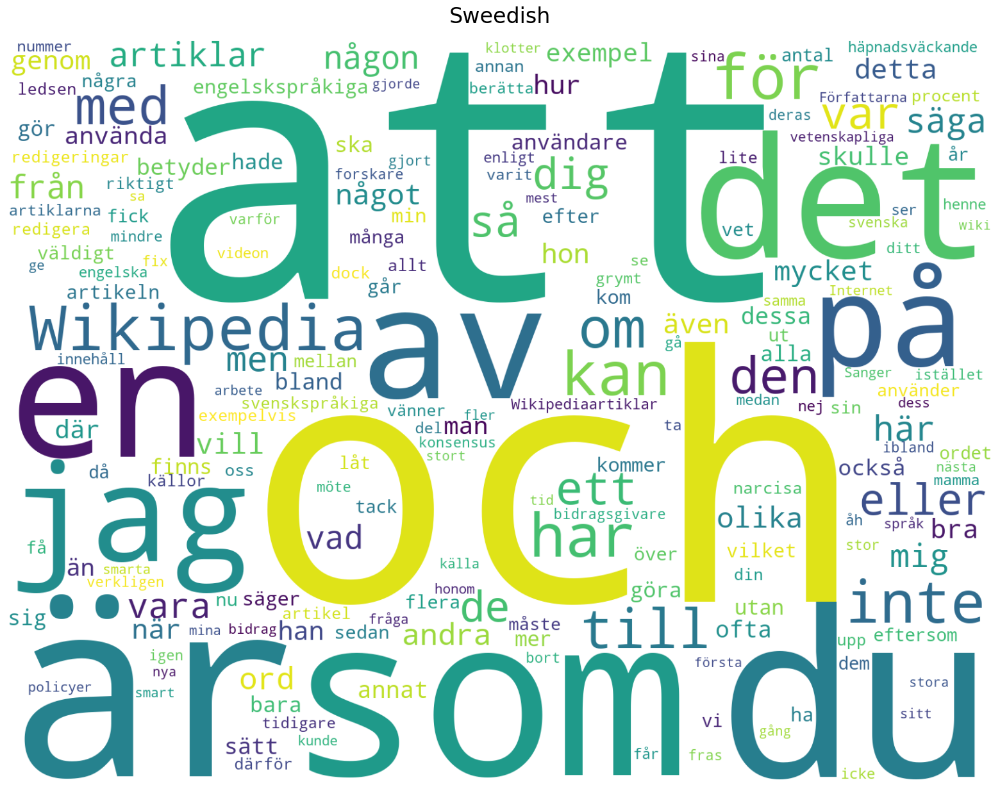

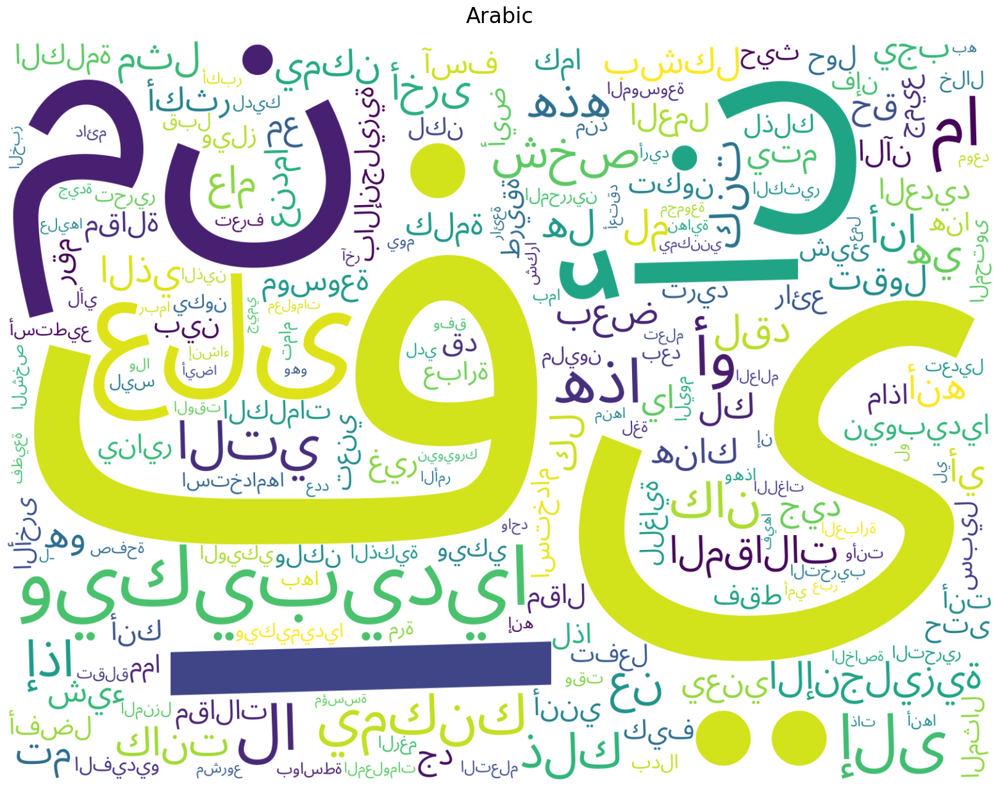

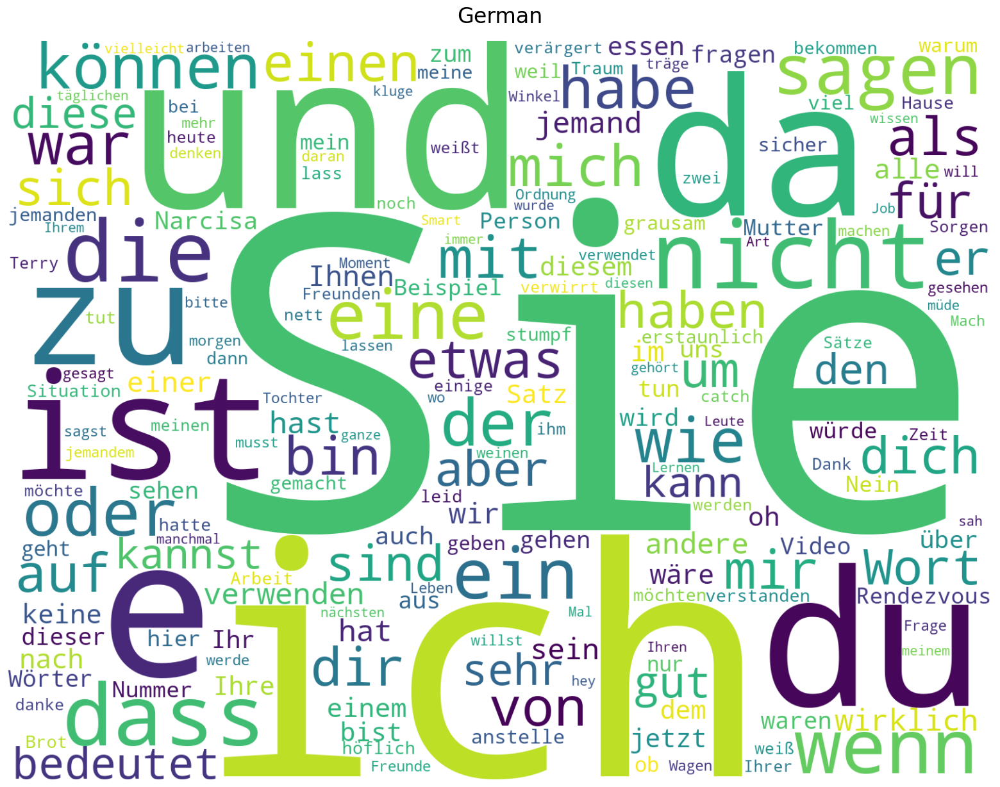

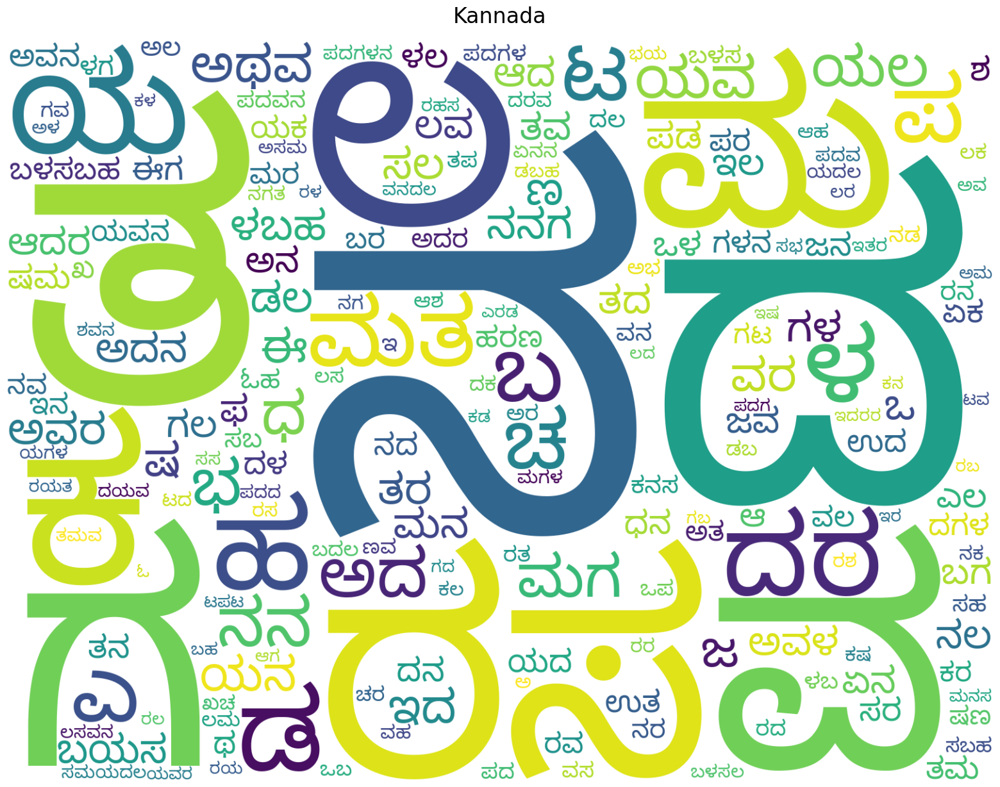

In [277]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os

for lang in df['Language'].unique():
    texts = df[df['Language'] == lang]['Text'].tolist()
    if not texts:
        continue
    
    font_path = None
    if lang in FONT_PATHS:
        font_path = FONT_PATHS[lang]
        if not os.path.exists(font_path):
            print(f"Шрифт для {lang} не найден, используется системный")
            font_path = None

    try:
        wc = WordCloud(
            font_path=font_path,
            width=1600,
            height=1200,
            background_color='white',
            collocations=False,
            max_words=200,
            min_font_size=8,
            prefer_horizontal=0.9 if lang in ["Arabic", "Hebrew"] else 1.0
        ).generate(' '.join(texts))
        
        plt.figure(figsize=(20, 15))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'{lang}', fontsize=24, pad=20)
        plt.show()
        
    except Exception as e:
        print(f"Ошибка для {lang}: {str(e)}")

## 4. Векторизация

1. Bad of Words

In [282]:
from sklearn.feature_extraction.text import CountVectorizer

In [283]:
df['Лемматизированный текст'][0]

'natur broadest sens natur physic materi world univers'

In [284]:
vectorizer = CountVectorizer()
vectorizer.fit(df['Лемматизированный текст'])

CountVectorizer()

In [285]:
# print(vectorizer.vocabulary_)

In [286]:
vectorizer = CountVectorizer(analyzer='word', stop_words=list(all_stopwords), ngram_range=(1, 3), min_df=2)
count_matrix = vectorizer.fit_transform(df['Лемматизированный текст'])

C:\Users\User\anaconda3\Lib\site-packages\sklearn\feature_extraction\text.py:408: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['δι', 'آمين', 'أب', 'أخ', 'أفعل', 'أفعله', 'ؤلاء', 'إل', 'إم', 'ات', 'اتان', 'ارتد', 'ان', 'انفك', 'برح', 'تان', 'تبد', 'تحو', 'تعل', 'حد', 'حم', 'حي', 'خب', 'ذار', 'سيما', 'صه', 'ظل', 'ظن', 'عد', 'قط', 'مر', 'مكان', 'مكانكن', 'نب', 'هات', 'هب', 'واها', 'وراء', 'ἀλλ'] not in stop_words.
  warnings.warn(


In [287]:
count_matrix.shape

(10337, 21793)

In [288]:
vectorizer.get_feature_names_out()[16000:17000]

array(['جذر كلم', 'جذر لتي', 'جرء', 'جرؤ', 'جرب', 'جرد', 'جزء', 'جزء كبر',
       'جلة', 'جلس', 'جمع', 'جمع جمع', 'جمع كيبيد', 'جمل', 'جمل عرف',
       'جنب', 'جنو', 'جني', 'جهد', 'جهل', 'جوز', 'جون', 'جيد', 'جيد جدا',
       'جيد شكل', 'حاج', 'حاد', 'حال', 'حالك', 'حتا', 'حتي', 'حتي موسوعة',
       'حد', 'حد كبر', 'حدة', 'حدث', 'حدث شيء', 'حدد', 'حدق', 'حذف',
       'حرب', 'حرة', 'حرر', 'حرر سهم', 'حرر قال', 'حرر قال كيبيد',
       'حرر كيبيد', 'حرر ويكيبيديا', 'حرر يتم', 'حرف', 'حرك', 'حرير',
       'حزن', 'حسس', 'حسن', 'حصل', 'حصل خبر', 'حصل درج', 'حصل عليها',
       'حصل وظف', 'حضر', 'حظة', 'حفظ', 'حفل', 'حق', 'حقق', 'حقق حلم',
       'حكم', 'حل', 'حلة', 'حلت', 'حلت كيبيد', 'حلت كيبيد رتب', 'حلل',
       'حلم', 'حلي', 'حلي نصف', 'حمل', 'حمل لجد', 'حمي', 'حمي صفح', 'حول',
       'حوي', 'حوي قال', 'حية', 'حية يوم', 'حيت', 'حيت يوم', 'حير', 'حيل',
       'خاص', 'خبر', 'خبر احد', 'خبراء', 'خبز', 'خبز صنع', 'خبز هاه',
       'خدم', 'خدم بدل', 'خدم حيت', 'خدم حيت يوم', 'خدم عدل', 'خدم كل

In [289]:
print(count_matrix)

  (0, 7716)	2
  (0, 1586)	1
  (0, 10475)	1
  (0, 8791)	1
  (0, 7121)	1
  (0, 13124)	1
  (0, 12024)	1
  (1, 7716)	1
  (1, 8791)	1
  (1, 13124)	1
  (1, 9780)	1
  (1, 8768)	1
  (1, 6689)	1
  (1, 4819)	1
  (1, 7736)	1
  (2, 7716)	1
  (2, 11133)	1
  (2, 6449)	1
  (2, 8549)	1
  (2, 10351)	1
  (2, 11136)	1
  (3, 7716)	2
  (3, 8768)	1
  (3, 8549)	1
  (3, 380)	1
  :	:
  (10334, 19706)	1
  (10334, 20312)	1
  (10334, 20151)	1
  (10334, 20079)	1
  (10334, 20108)	1
  (10335, 3951)	1
  (10335, 19688)	1
  (10335, 20054)	1
  (10335, 19634)	1
  (10335, 19975)	1
  (10336, 19715)	1
  (10336, 20284)	1
  (10336, 20057)	1
  (10336, 19807)	1
  (10336, 19646)	1
  (10336, 19774)	1
  (10336, 19626)	1
  (10336, 19843)	1
  (10336, 19728)	1
  (10336, 20195)	1
  (10336, 19733)	1
  (10336, 19676)	1
  (10336, 19677)	1
  (10336, 20269)	1
  (10336, 20270)	1


2. TF-IDF

In [389]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [399]:

tfidf_vectorizer = TfidfVectorizer(analyzer='char',     
                                   ngram_range=(2, 5),  
                                   max_features=20000,  
                                   lowercase=True)

In [401]:
%%time
tfidf_matrix = tfidf_vectorizer.fit_transform(df['Лемматизированный текст'])

CPU times: total: 1.88 s
Wall time: 1.87 s


In [403]:
tfidf_matrix.shape

(10337, 20000)

In [405]:
tfidf_vectorizer.get_feature_names_out()[:100]

array([' a', ' aa', ' ab', ' abo', ' ac', ' aca', ' acad', ' acc',
       ' acce', ' acco', ' accu', ' ace', ' act', ' acti', ' actu', ' ad',
       ' ada', ' add', ' ade', ' adm', ' admi', ' af', ' aff', ' ag',
       ' ago', ' agr', ' ai', ' ak', ' al', ' alc', ' alcu', ' ale',
       ' alem', ' alg', ' algo', ' algu', ' all', ' alle', ' allo',
       ' alm', ' alo', ' alor', ' alt', ' alte', ' altr', ' am', ' ama',
       ' ame', ' amer', ' ami', ' amig', ' amo', ' amp', ' amé', ' an',
       ' ana', ' anal', ' and', ' andr', ' ang', ' angl', ' ani', ' anim',
       ' anl', ' anla', ' ann', ' anna', ' anno', ' ano', ' anot', ' ans',
       ' ant', ' anti', ' anv', ' anvä', ' ap', ' apa', ' apar', ' ape',
       ' apen', ' app', ' appe', ' appl', ' appr', ' apr', ' apre', ' aq',
       ' aqu', ' ar', ' arb', ' arbe', ' arg', ' arr', ' art', ' arti',
       ' as', ' asi', ' asi ', ' ass', ' assi'], dtype=object)

In [407]:
print(tfidf_matrix)

  (0, 6989)	0.08492210746600515
  (0, 8557)	0.08859959197143481
  (0, 12152)	0.08890933491739683
  (0, 1372)	0.08938564389058025
  (0, 9332)	0.11096495239056389
  (0, 12588)	0.10706545577685787
  (0, 1488)	0.10808493104697166
  (0, 3474)	0.10133286120103692
  (0, 7879)	0.10133286120103692
  (0, 788)	0.09939618782785523
  (0, 11892)	0.10203503831720194
  (0, 860)	0.07504104281198999
  (0, 1177)	0.11096495239056389
  (0, 5459)	0.11228208031350563
  (0, 3507)	0.15087194597001216
  (0, 8298)	0.1469883468243278
  (0, 12412)	0.06705004512418268
  (0, 6987)	0.080408177855062
  (0, 8556)	0.08631868090820131
  (0, 12151)	0.08890933491739683
  (0, 1371)	0.080408177855062
  (0, 10400)	0.11096495239056389
  (0, 9331)	0.10706545577685787
  (0, 12587)	0.10706545577685787
  (0, 1485)	0.08096575517922726
  :	:
  (10336, 18271)	0.08280245829360337
  (10336, 18563)	0.07836902897478305
  (10336, 18183)	0.08390660149024513
  (10336, 18731)	0.07683551187628762
  (10336, 18659)	0.0817705345476373
  (10336, 

## 5. Классификация

In [410]:
X_text = tfidf_vectorizer.fit_transform(df['Токенизированный текст'])

In [411]:
from sklearn.model_selection import train_test_split
y = df['Language']
X_train, X_test, y_train, y_test = train_test_split(X_text, y, test_size=0.4, random_state=19)

### RandomForestClassifier

In [413]:
from sklearn.ensemble import RandomForestClassifier
randomfc = RandomForestClassifier(n_estimators=100)
randomfc.fit(X_train, y_train)

RandomForestClassifier()

In [414]:
y_pred = randomfc.predict(X_test)

In [415]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

      Arabic       1.00      0.98      0.99       206
      Danish       0.80      0.69      0.74       172
       Dutch       0.90      0.85      0.87       213
     English       0.90      0.95      0.93       559
      French       0.95      0.93      0.94       430
      German       0.86      0.87      0.86       208
       Greek       1.00      1.00      1.00       148
       Hindi       1.00      1.00      1.00        24
     Italian       0.92      0.90      0.91       280
     Kannada       1.00      0.99      0.99       157
   Malayalam       1.00      0.99      0.99       247
  Portugeese       0.87      0.80      0.83       283
     Russian       0.91      1.00      0.95       280
     Spanish       0.84      0.86      0.85       311
    Sweedish       0.83      0.91      0.87       256
       Tamil       1.00      0.99      1.00       182
     Turkish       0.99      0.94      0.97       179

    accuracy              

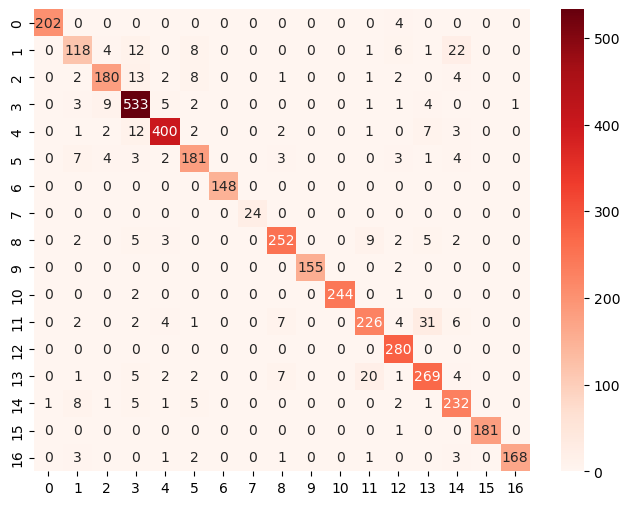

In [421]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds')
plt.show()

### LogisticRegression

In [424]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(random_state = 42)
lr.fit(X_train, y_train)

LogisticRegression(random_state=42)

In [425]:
y_pred = lr.predict(X_test)
print(classification_report(y_test, y_pred, zero_division=1))

              precision    recall  f1-score   support

      Arabic       1.00      0.99      0.99       206
      Danish       0.94      0.78      0.86       172
       Dutch       0.94      0.90      0.92       213
     English       0.89      0.99      0.94       559
      French       0.97      0.97      0.97       430
      German       0.93      0.91      0.92       208
       Greek       1.00      1.00      1.00       148
       Hindi       1.00      1.00      1.00        24
     Italian       0.96      0.93      0.94       280
     Kannada       1.00      0.99      1.00       157
   Malayalam       1.00      1.00      1.00       247
  Portugeese       0.92      0.89      0.90       283
     Russian       1.00      0.99      0.99       280
     Spanish       0.90      0.91      0.90       311
    Sweedish       0.90      0.95      0.92       256
       Tamil       1.00      0.99      1.00       182
     Turkish       1.00      0.94      0.97       179

    accuracy              

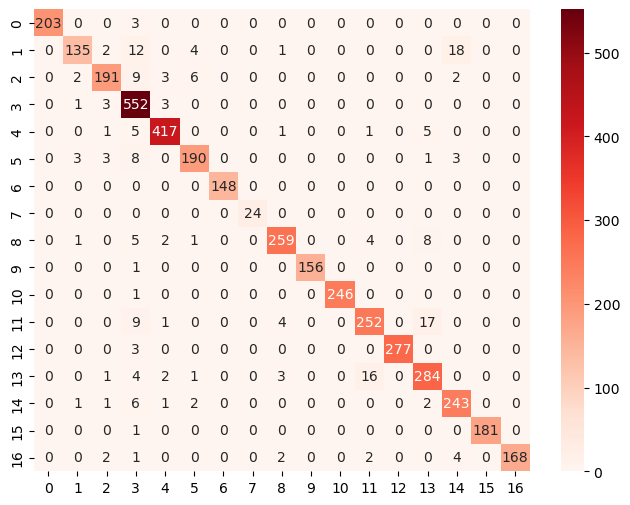

In [426]:
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds')
plt.show()

### SGDClassifier

In [607]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(loss='log_loss',      
                        penalty='l2',  
                        alpha=1e-4,        
                        max_iter=1000,
                        random_state=42,
                        class_weight='balanced') 

In [609]:
sgd_clf.fit(X_train, y_train)
y_pred = sgd_clf.predict(X_test)

In [611]:
print(classification_report(y_test, y_pred, zero_division=1))

              precision    recall  f1-score   support

      Arabic       1.00      0.99      0.99       206
      Danish       0.90      0.85      0.87       172
       Dutch       0.91      0.91      0.91       213
     English       0.96      0.96      0.96       559
      French       0.97      0.97      0.97       430
      German       0.79      0.96      0.86       208
       Greek       1.00      1.00      1.00       148
       Hindi       1.00      1.00      1.00        24
     Italian       0.95      0.94      0.95       280
     Kannada       1.00      1.00      1.00       157
   Malayalam       1.00      1.00      1.00       247
  Portugeese       0.91      0.91      0.91       283
     Russian       1.00      0.99      0.99       280
     Spanish       0.94      0.91      0.92       311
    Sweedish       0.94      0.95      0.94       256
       Tamil       1.00      0.99      1.00       182
     Turkish       0.99      0.95      0.97       179

    accuracy              

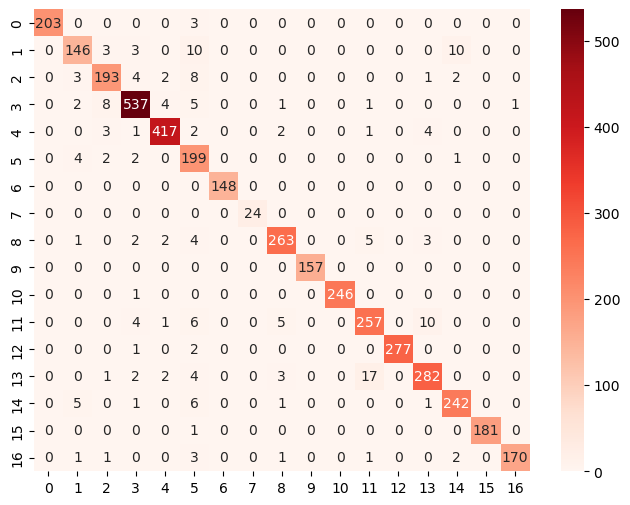

In [613]:
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds')
plt.show()

Лучше всего себя показала __SGDClassifier__ с результатом 0.96. Будем её использовать.

## 6. Парсинг данных

Парсинг будет происходит с сайта reddit.com и habr.com, так как на нем содежрится множетсво статей на разных языках

In [467]:
import requests
import pandas as pd
from bs4 import BeautifulSoup as bs
import time


In [469]:
headers = {'User-Agent': 'Mozilla/5.0'}

In [471]:
urls = [
    'https://habr.com/ru/articles/page1/',
    'https://www.reddit.com/r/MalayalamMovies/',
    'https://www.reddit.com/r/GREEK/',
    'https://www.reddit.com/r/kannada/',
    'https://www.reddit.com/r/TamilNadu/',
    'https://www.reddit.com/r/saudiarabia/',
    'https://www.reddit.com/r/france/',
    'https://www.reddit.com/r/usajobs/',
    'https://www.reddit.com/r/Spanish/',
    'https://www.reddit.com/r/Italia/',
    'https://www.reddit.com/r/Turkey/',
    'https://www.reddit.com/r/HindiMemes/',
    'https://www.reddit.com/r/portugal/',
    'https://www.reddit.com/r/sweden/',
    'https://www.reddit.com/r/dutch/',
    'https://www.reddit.com/r/danishlanguage/']

In [473]:
def get_reddit_titles_api(subreddit, count=41):
    url = f'https://www.reddit.com/r/{subreddit}/top/.json?limit={count}'
    try:
        response = requests.get(url, headers=headers)
        if response.status_code == 200:
            data = response.json()
            titles = [post['data']['title'] for post in data['data']['children']]
            return titles
        else:
            print(f"Ошибка при запросе {url}: {response.status_code}")
            return []
    except Exception as e:
        print(f"Ошибка: {e}")
        return []

In [530]:
data = []
for url in urls:
    print(f"\nПарсинг: {url}")
    if 'reddit.com' in url:
        # Обработка Reddit
        subreddit_name = url.split('/r/')[1].split('/')[0]
        titles = get_reddit_titles_api(subreddit_name, count=60)
        for title in titles:
            data.append({'url': url, 'Text': title})
    else:
        # Обработка сайта habr
        pagenum = 1
        while len([item for item in data if item['url'] == url]) < 55:
            page_url = url.replace('page1', 'page' + str(pagenum))
            page = requests.get(page_url)
            soup = bs(page.text, 'html.parser')
            titles = soup.find_all('h2', class_='tm-title tm-title_h2')
            for title in titles:
                if len([item for item in data if item['url'] == url]) >= 55:
                    break
                data.append({'url': url, 'Text': title.text.strip()})
            pagenum += 1
    time.sleep(2)


Парсинг: https://habr.com/ru/articles/page1/

Парсинг: https://www.reddit.com/r/MalayalamMovies/

Парсинг: https://www.reddit.com/r/GREEK/

Парсинг: https://www.reddit.com/r/kannada/

Парсинг: https://www.reddit.com/r/TamilNadu/

Парсинг: https://www.reddit.com/r/saudiarabia/

Парсинг: https://www.reddit.com/r/france/

Парсинг: https://www.reddit.com/r/usajobs/

Парсинг: https://www.reddit.com/r/Spanish/

Парсинг: https://www.reddit.com/r/Italia/

Парсинг: https://www.reddit.com/r/Turkey/

Парсинг: https://www.reddit.com/r/HindiMemes/

Парсинг: https://www.reddit.com/r/portugal/

Парсинг: https://www.reddit.com/r/sweden/

Парсинг: https://www.reddit.com/r/dutch/

Парсинг: https://www.reddit.com/r/danishlanguage/


In [531]:
df_parsing = pd.DataFrame(data)

In [532]:
df_parsing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 462 entries, 0 to 461
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   url     462 non-null    object
 1   Text    462 non-null    object
dtypes: object(2)
memory usage: 7.3+ KB


In [559]:
df_parsing

,url,Text,Обработанный текст
0,https://habr.com/ru/articles/page1/,Сложная оркестрация,сложная оркестрация
1,https://habr.com/ru/articles/page1/,Рак-богомол и акустика,рак богомол и акустика
2,https://habr.com/ru/articles/page1/,Инфобез кардинально изменился с применением ИИ...,инфобез кардинально изменился с применением ии...
3,https://habr.com/ru/articles/page1/,«Почему в странах Восточной Европы половина уч...,почему в странах восточной европы половина уч...
4,https://habr.com/ru/articles/page1/,Continuous Thought Machines,continuous thought machines
...,...,...,...
457,https://www.reddit.com/r/sweden/,Foreign student needs help picking university/...,foreign student needs help picking university ...
458,https://www.reddit.com/r/sweden/,Råd om klocka,råd om klocka
459,https://www.reddit.com/r/dutch/,Drie van de vier kabinets partijen steunden ee...,drie van de vier kabinets partijen steunden ee...
460,https://www.reddit.com/r/dutch/,Amber alert voor vermiste kinderen uit omgevin...,amber alert voor vermiste kinderen uit omgevin...


In [596]:
def preprocess_text(text):
    text = text.lower()
    text = remove_punctuation(text)
    text = remove_numbers(text)
    text = remove_othersymbol(text)
    text = remove_multiple_spaces(text)
    return text
    
df_parsing['Обработанный текст'] = df_parsing['Text'].apply(preprocess_text)
df_parsing = df_parsing.dropna(subset=['Обработанный текст']).reset_index(drop=True)
df_parsing

,url,Text,Обработанный текст
0,https://habr.com/ru/articles/page1/,Сложная оркестрация,сложная оркестрация
1,https://habr.com/ru/articles/page1/,Рак-богомол и акустика,рак богомол и акустика
2,https://habr.com/ru/articles/page1/,Инфобез кардинально изменился с применением ИИ...,инфобез кардинально изменился с применением ии...
3,https://habr.com/ru/articles/page1/,«Почему в странах Восточной Европы половина уч...,почему в странах восточной европы половина уч...
4,https://habr.com/ru/articles/page1/,Continuous Thought Machines,continuous thought machines
...,...,...,...
457,https://www.reddit.com/r/sweden/,Foreign student needs help picking university/...,foreign student needs help picking university ...
458,https://www.reddit.com/r/sweden/,Råd om klocka,råd om klocka
459,https://www.reddit.com/r/dutch/,Drie van de vier kabinets partijen steunden ee...,drie van de vier kabinets partijen steunden ee...
460,https://www.reddit.com/r/dutch/,Amber alert voor vermiste kinderen uit omgevin...,amber alert voor vermiste kinderen uit omgevin...


In [597]:
labeled_texts = list(df['Обработанный текст'])  
labeled_labels = list(df['Language'])        
remaining_df = df_parsing.copy()

In [601]:
for i in range(5):
    print(f"\n Итерация {i + 1}")
    X_remain = tfidf_vectorizer.transform(remaining_df['Обработанный текст'])
    probs = sgd_clf.predict_proba(X_remain)
    preds = sgd_clf.predict(X_remain)
    max_probs = np.max(probs, axis=1)
    confident_mask = (max_probs >= 0.8) | (max_probs <= 0.2)
    confident_df = remaining_df[confident_mask].copy()
    confident_preds = preds[confident_mask]
    print(f" Добавлено примеров: {len(confident_df)}")
    labeled_texts += list(confident_df['Обработанный текст'])
    labeled_labels += list(confident_preds)
    remaining_df = remaining_df[~confident_mask].reset_index(drop=True)
    X_train_new = tfidf_vectorizer.transform(labeled_texts)
    sgd_clf = SGDClassifier(loss='log_loss',      
                        penalty='l2',  
                        alpha=1e-4,        
                        max_iter=1000,
                        random_state=42,
                        class_weight='balanced') 
    sgd_clf.fit(X_train_new, labeled_labels)
    if len(remaining_df) == 0:
        print("Все данные размечены.")
        break


 Итерация 1
 Добавлено примеров: 97

 Итерация 2
 Добавлено примеров: 33

 Итерация 3
 Добавлено примеров: 1

 Итерация 4
 Добавлено примеров: 1

 Итерация 5
 Добавлено примеров: 0


In [588]:
if len(remaining_df) > 0:
    X_remain = tfidf_vectorizer.transform(remaining_df['Обработанный текст'])
    remaining_df['Language'] = sgd_clf.predict(X_remain)
df_parsing_final = pd.concat([confident_df.assign(Language=confident_preds), remaining_df], ignore_index=True)
df_parsing_final

,url,Text,Обработанный текст,Language
0,https://habr.com/ru/articles/page1/,Сложная оркестрация,сложная оркестрация,Russian
1,https://habr.com/ru/articles/page1/,Рак-богомол и акустика,рак богомол и акустика,Russian
2,https://habr.com/ru/articles/page1/,Continuous Thought Machines,continuous thought machines,English
3,https://habr.com/ru/articles/page1/,GIMP: устранение дефекта масштабирования,gimp устранение дефекта масштабирования,Russian
4,https://habr.com/ru/articles/page1/,Весна 2025 в ИИ: OpenAI и Google укрепляют поз...,весна в ии openai и google укрепляют позиции a...,Russian
...,...,...,...,...
276,https://www.reddit.com/r/sweden/,Foreign student needs help picking university/...,foreign student needs help picking university ...,English
277,https://www.reddit.com/r/sweden/,Råd om klocka,råd om klocka,Sweedish
278,https://www.reddit.com/r/dutch/,Drie van de vier kabinets partijen steunden ee...,drie van de vier kabinets partijen steunden ee...,Dutch
279,https://www.reddit.com/r/dutch/,Amber alert voor vermiste kinderen uit omgevin...,amber alert voor vermiste kinderen uit omgevin...,Dutch


Модель хорошо предсказала языки.

## 7. Экспорт модели

In [615]:
import pickle

with open ('vectorizer_fp.pkl', 'wb') as file:
    pickle.dump(tfidf_vectorizer, file)

with open('sgdclf_fp.pkl', 'wb') as file:
    pickle.dump(sgd_clf, file)